In [1]:
import librosa
import librosa.display
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import numpy as np
import os

In [2]:
sns.set()
matplotlib.rcParams['figure.figsize'] = (12, 7)

In [3]:
path = os.path.join('music_sample', 'sample.wav')

In [4]:
y, sr = librosa.load(path)

In [5]:
y.shape

(4675585,)

In [6]:
import IPython
IPython.display.Audio(y, rate=sr)

# Sygnał dźwiękowy

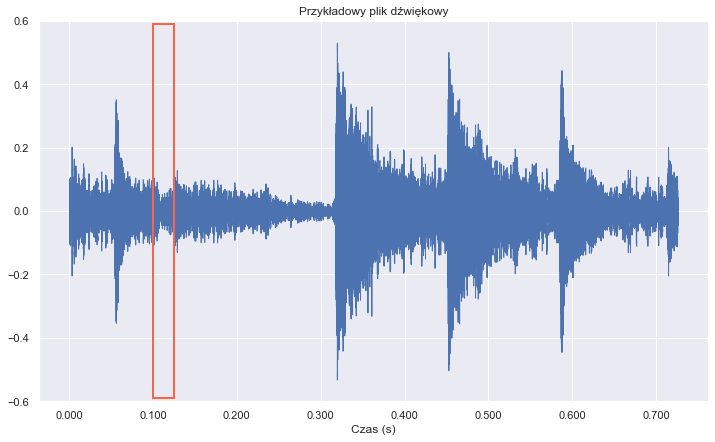

In [7]:
fig = plt.figure()
librosa.display.waveshow(y[4000:20000], sr=sr)

plt.gca().add_patch(Rectangle((0.1, -0.59), 0.025, 1.18,
                    edgecolor='tomato',
                    facecolor='none',
                    lw=2))
plt.ylim(-0.6, 0.6)
plt.title('Przykładowy plik dźwiękowy')
plt.xlabel('Czas (s)')
plt.show()

In [28]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\syngal_ramgki.png')

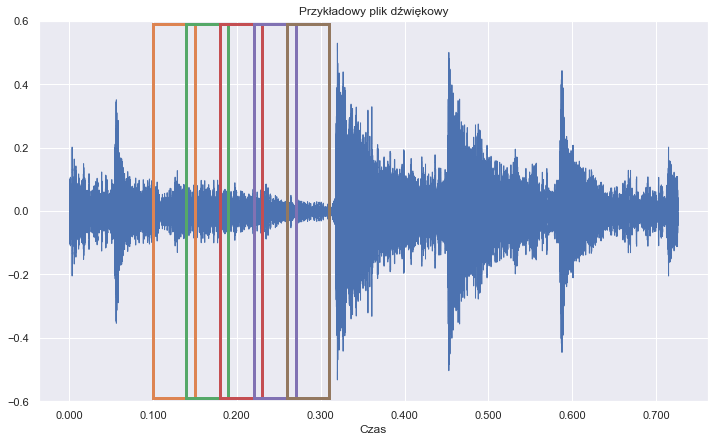

In [9]:
fig = plt.figure()
librosa.display.waveshow(y[4000:20000], sr=sr)

colors = sns.color_palette(as_cmap=True)[1:6]

for i in range(5):
    plt.gca().add_patch(Rectangle((0.1 + i * 0.04, -0.59), 0.05, 1.18,
                    edgecolor=colors[i],
                    facecolor='none',
                    lw=3))
plt.ylim(-0.6, 0.6)
plt.title('Przykładowy plik dźwiękowy')
plt.xlabel('Czas')
plt.show()

# Spektrogram amplitudy

In [8]:
(np.abs(librosa.stft(y[4000:20000], n_fft=100, hop_length=512) ** 2)).shape

(51, 32)

In [9]:
(np.abs(librosa.stft(y)) ** 2).shape

(1025, 9133)

In [10]:
file = 'data_speech_command\\train\\two\\d94eb94f_nohash_0.wav'

In [11]:
y, sr = librosa.load(file)

In [12]:
(np.abs(librosa.stft(y, n_fft=100, hop_length=512)) ** 2).shape

(51, 44)

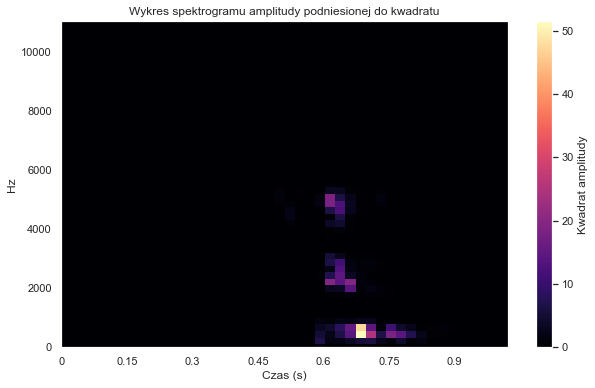

In [13]:
fig = plt.figure(figsize=(10, 6))
img = librosa.display.specshow(np.abs(librosa.stft(y, n_fft=100, hop_length=512) ** 2),
                        sr=sr, x_axis='time', y_axis='hz')
plt.title('Wykres spektrogramu amplitudy podniesionej do kwadratu')
fig.colorbar(img, label='Kwadrat amplitudy')
plt.xlabel('Czas (s)')
plt.show()

In [127]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\energia.png')

# Filtry melowe

Text(0.5, 1.0, 'Zespół filtrów melowych')

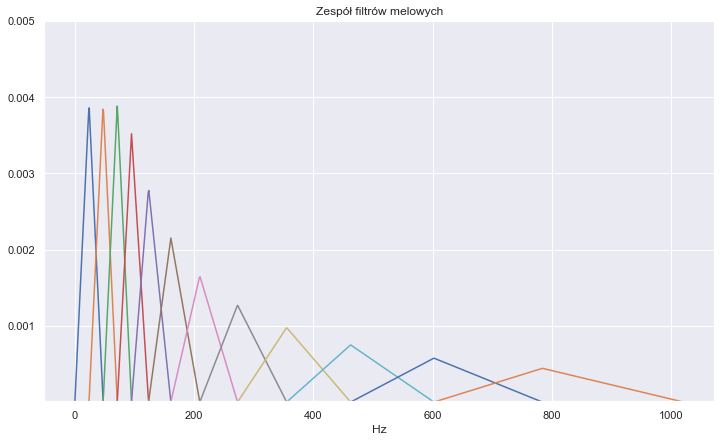

In [14]:
fig = plt.figure()

mel_basis = librosa.filters.mel(sr=sr, n_fft=2042, n_mels=12)
plt.plot(mel_basis.T)
plt.ylim(0.00001, 0.005)
plt.xlabel('Hz')
plt.title('Zespół filtrów melowych')

In [174]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\filtry_melowe.png')

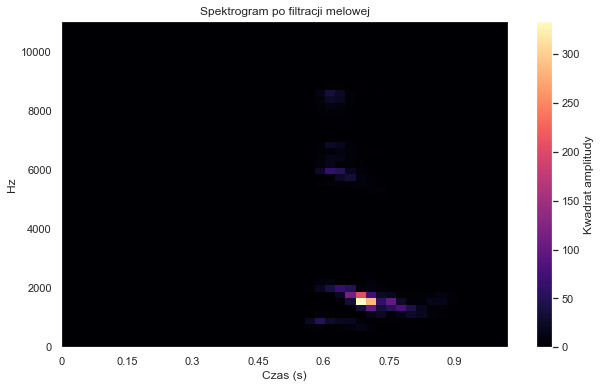

In [15]:
fig = plt.figure(figsize=(10, 6))
S = librosa.feature.melspectrogram(y, sr=sr, hop_length=512, n_mels=51)
img = librosa.display.specshow(S, x_axis='time', y_axis='hz')
plt.title('Spektrogram po filtracji melowej')
cbar = fig.colorbar(img, label='Kwadrat amplitudy')
plt.xlabel('Czas (s)')
plt.show()

In [129]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\energia_melowa.png')

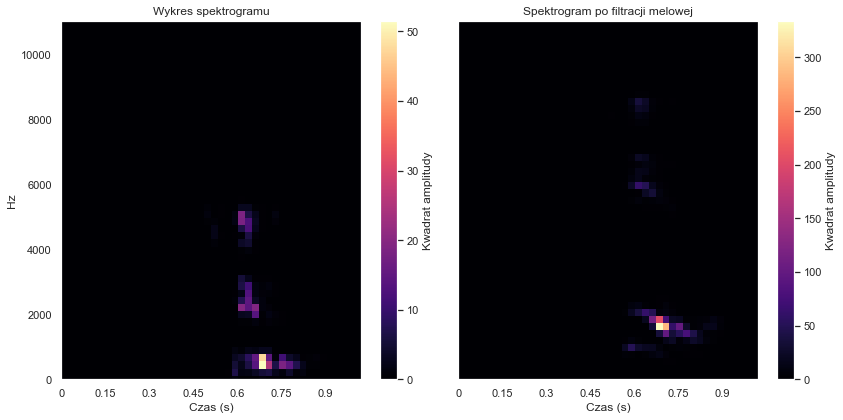

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

img = librosa.display.specshow(np.abs(librosa.stft(y, n_fft=100, hop_length=512) ** 2),
                        sr=sr, x_axis='time', y_axis='hz', ax=ax[0])
ax[0].set_title('Wykres spektrogramu')
fig.colorbar(img, label='Kwadrat amplitudy', ax=ax[0])
ax[0].set_xlabel('Czas (s)')

S = librosa.feature.melspectrogram(y, sr=sr, hop_length=512, n_mels=51)
img = librosa.display.specshow(S, x_axis='time', ax=ax[1])
ax[1].set_title('Spektrogram po filtracji melowej')
cbar = fig.colorbar(img, label='Kwadrat amplitudy')
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [144]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\porowannie_spekt.png')

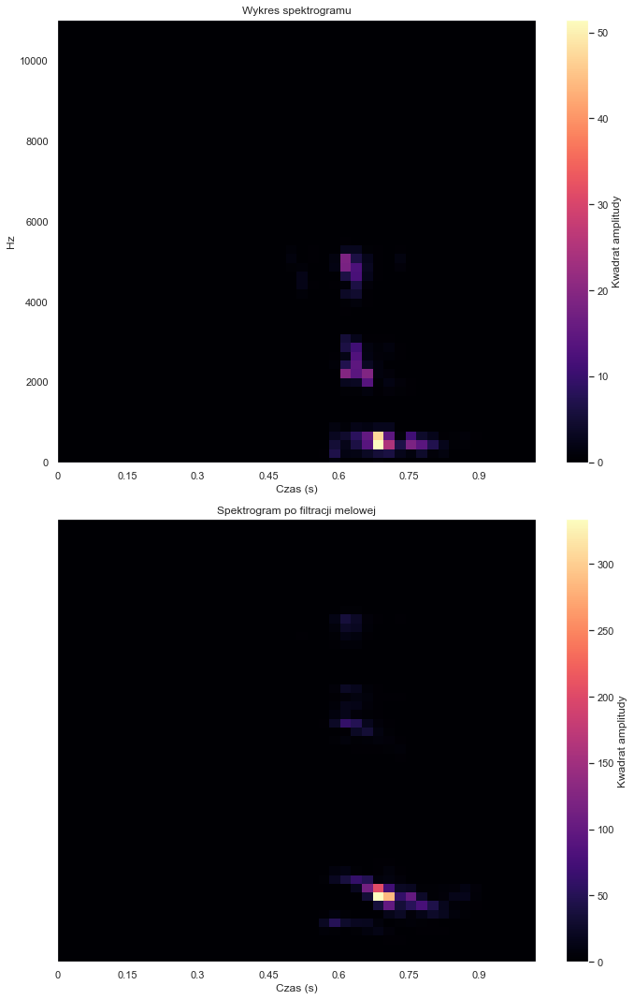

In [18]:
fig, ax = plt.subplots(2, 1, figsize=(10, 15))

img = librosa.display.specshow(np.abs(librosa.stft(y, n_fft=100, hop_length=512) ** 2),
                        sr=sr, x_axis='time', y_axis='hz', ax=ax[0])
ax[0].set_title('Wykres spektrogramu')
fig.colorbar(img, label='Kwadrat amplitudy', ax=ax[0])
ax[0].set_xlabel('Czas (s)')

S = librosa.feature.melspectrogram(y, sr=sr, hop_length=512, n_mels=51)
img = librosa.display.specshow(S, x_axis='time', ax=ax[1])
ax[1].set_title('Spektrogram po filtracji melowej')
cbar = fig.colorbar(img, label='Kwadrat amplitudy')
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [144]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\porowannie_spekt.png')

# Skala decybelowa

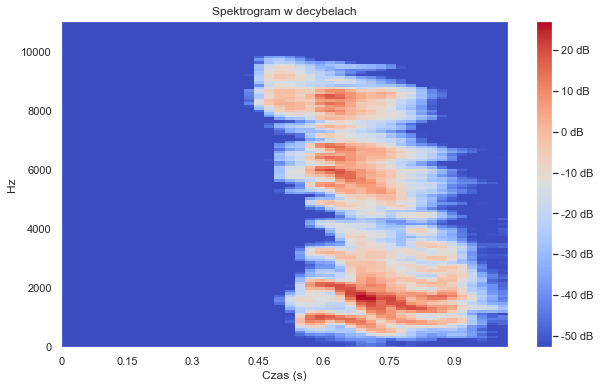

In [19]:
fig = plt.figure(figsize=(10, 6))
S = librosa.power_to_db(librosa.feature.melspectrogram(y, hop_length=512))
img = librosa.display.specshow(S, x_axis='time', y_axis='hz')
plt.title('Spektrogram w decybelach')
cbar = fig.colorbar(img, format='%d dB')
plt.xlabel('Czas (s)')
plt.show()

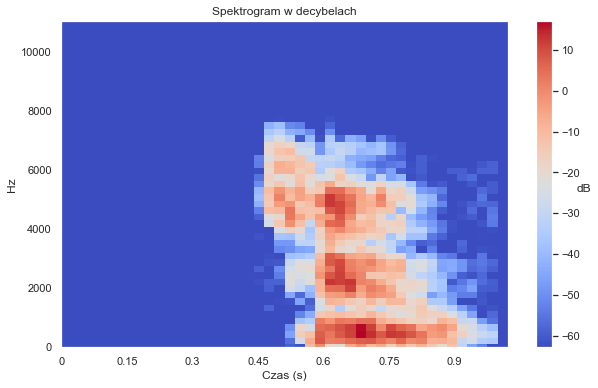

In [20]:
fig = plt.figure(figsize=(10, 6))
img = librosa.display.specshow(librosa.power_to_db((np.abs(librosa.stft(y, n_fft=100, hop_length=512)) ** 2)),
                        x_axis='time', y_axis='hz')
plt.title('Spektrogram w decybelach')
cbar = fig.colorbar(img)
cbar.set_label('dB', rotation=360)
plt.xlabel('Czas (s)')
plt.show()

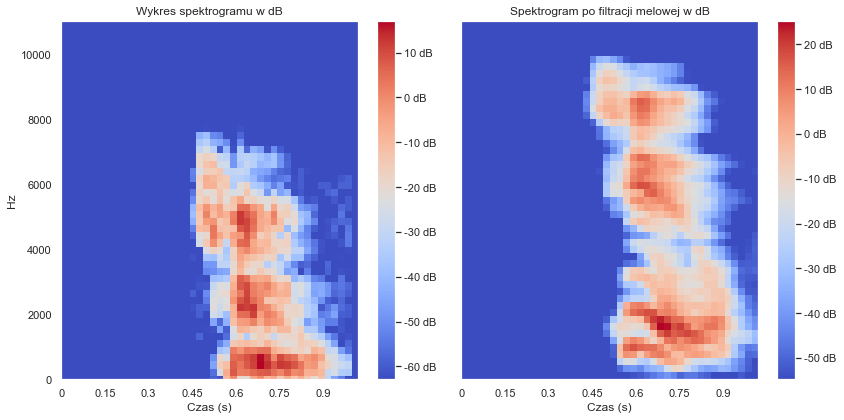

In [146]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

s = librosa.power_to_db(np.abs(librosa.stft(y, n_fft=100, hop_length=512) ** 2))
img = librosa.display.specshow(s,
                        sr=sr, x_axis='time', y_axis='hz', ax=ax[0])
ax[0].set_title('Wykres spektrogramu w dB')
fig.colorbar(img, format='%d dB', ax=ax[0])
ax[0].set_xlabel('Czas (s)')

S = librosa.power_to_db(librosa.feature.melspectrogram(y, sr= sr, hop_length=512, n_mels=51))
img = librosa.display.specshow(S, x_axis='time', ax=ax[1])
ax[1].set_title('Spektrogram po filtracji melowej w dB')
fig.colorbar(img, format='%d dB')
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [147]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\por_spekt_db.png')

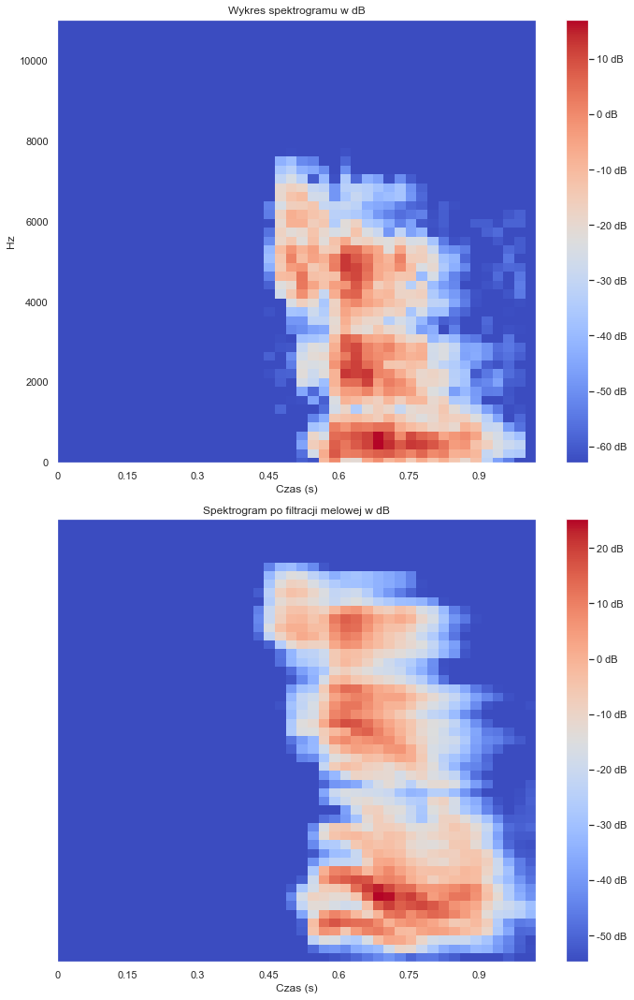

In [21]:
fig, ax = plt.subplots(2, 1, figsize=(10, 15))

s = librosa.power_to_db(np.abs(librosa.stft(y, n_fft=100, hop_length=512) ** 2))
img = librosa.display.specshow(s,
                        sr=sr, x_axis='time', y_axis='hz', ax=ax[0])
ax[0].set_title('Wykres spektrogramu w dB')
fig.colorbar(img, format='%d dB', ax=ax[0])
ax[0].set_xlabel('Czas (s)')

S = librosa.power_to_db(librosa.feature.melspectrogram(y, sr= sr, hop_length=512, n_mels=51))
img = librosa.display.specshow(S, x_axis='time', ax=ax[1])
ax[1].set_title('Spektrogram po filtracji melowej w dB')
fig.colorbar(img, format='%d dB')
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [22]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\por_spekt_db_ver.png')

# Współczynniki MFCC

In [23]:
S.shape

(51, 44)

In [24]:
from scipy.fftpack import dct
dct(S).shape

(51, 44)

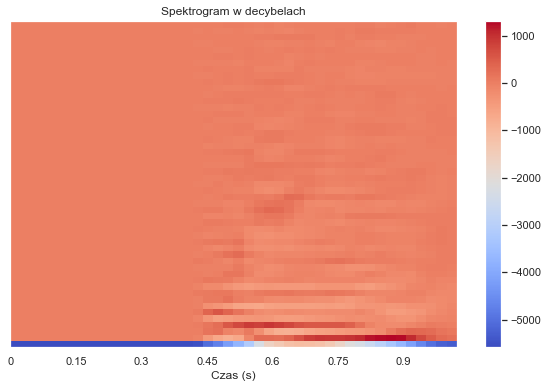

In [25]:
fig = plt.figure(figsize=(10, 6))
x  = dct(S, axis=0)
img = librosa.display.specshow(x, sr=sr,
                        x_axis='time')
plt.title('Spektrogram w decybelach')
cbar = fig.colorbar(img)
plt.xlabel('Czas (s)')
plt.show()

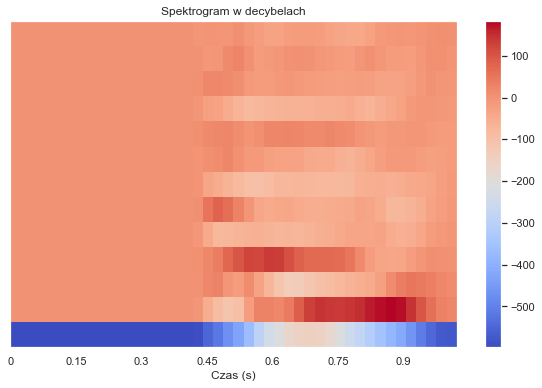

In [26]:
mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, hop_length=512)
fig = plt.figure(figsize=(10, 6))
img = librosa.display.specshow(mfcc, sr=sr,
                        x_axis='time')
plt.title('Spektrogram w decybelach')
cbar = fig.colorbar(img)
plt.xlabel('Czas (s)')
plt.show()

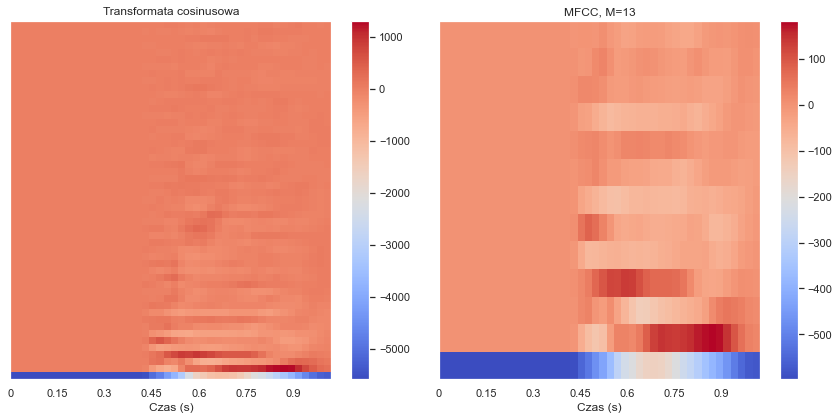

In [175]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

s = dct(S, axis=0)
img = librosa.display.specshow(s,
                        sr=sr, x_axis='time', ax=ax[0])
ax[0].set_title('Transformata cosinusowa')
fig.colorbar(img, ax=ax[0])
ax[0].set_xlabel('Czas (s)')

mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, hop_length=512)
img = librosa.display.specshow(mfcc, x_axis='time', ax=ax[1])
ax[1].set_title('MFCC, M=13')
fig.colorbar(img)
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [176]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\mfcc.png')

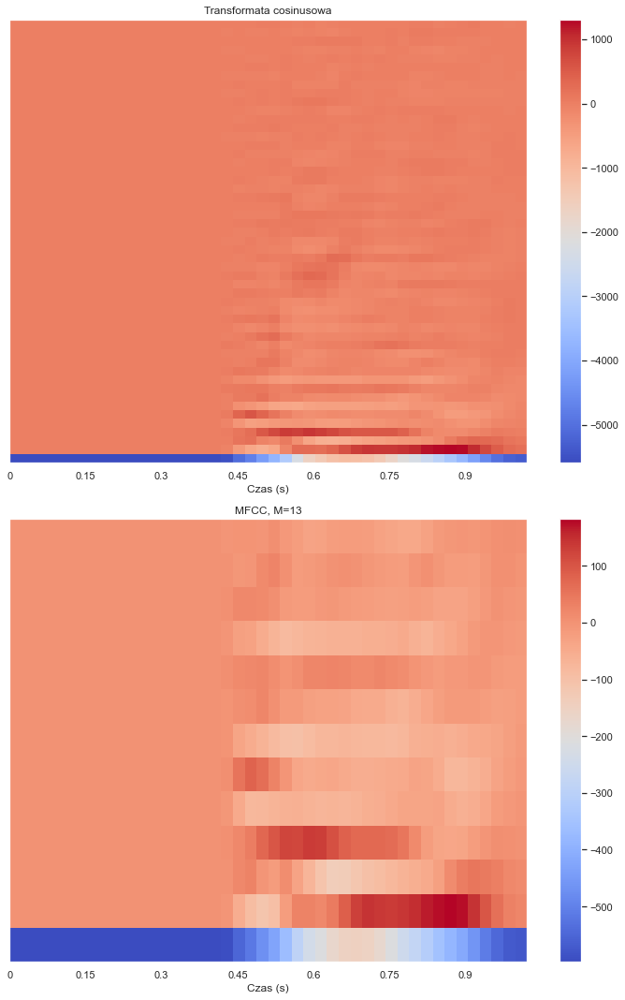

In [28]:
fig, ax = plt.subplots(2, 1, figsize=(10, 15))

s = dct(S, axis=0)
img = librosa.display.specshow(s,
                        sr=sr, x_axis='time', ax=ax[0])
ax[0].set_title('Transformata cosinusowa')
fig.colorbar(img, ax=ax[0])
ax[0].set_xlabel('Czas (s)')

mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13, hop_length=512)
img = librosa.display.specshow(mfcc, x_axis='time', ax=ax[1])
ax[1].set_title('MFCC, M=13')
fig.colorbar(img)
plt.xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [29]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\mfcc_vec.png')

# Szum

In [177]:
noises_path = ['data_speech_command\\train\\_background_noise_\\doing_the_dishes.wav',
 'data_speech_command\\train\\_background_noise_\\dude_miaowing.wav',
 'data_speech_command\\train\\_background_noise_\\exercise_bike.wav',
 'data_speech_command\\train\\_background_noise_\\pink_noise.wav',
 'data_speech_command\\train\\_background_noise_\\running_tap.wav',
 'data_speech_command\\train\\_background_noise_\\white_noise.wav']

In [179]:
noises = [librosa.load(i)[0] for i in noises_path]

In [181]:
[i.shape for i in noises]

[(2098788,), (1362816,), (1350648,), (1323000,), (1348479,), (1323000,)]

In [186]:
[i.split('\\')[-1][:-4] for i in noises_path]

['doing_the_dishes',
 'dude_miaowing',
 'exercise_bike',
 'pink_noise',
 'running_tap',
 'white_noise']

In [187]:
szumy = ['Zmywanie naczyń', 'Miauczenie', 'Jazda na rowerze', 'Różowy szum', 'Bieganie', 'Woda z kranu', 'Biały szum']

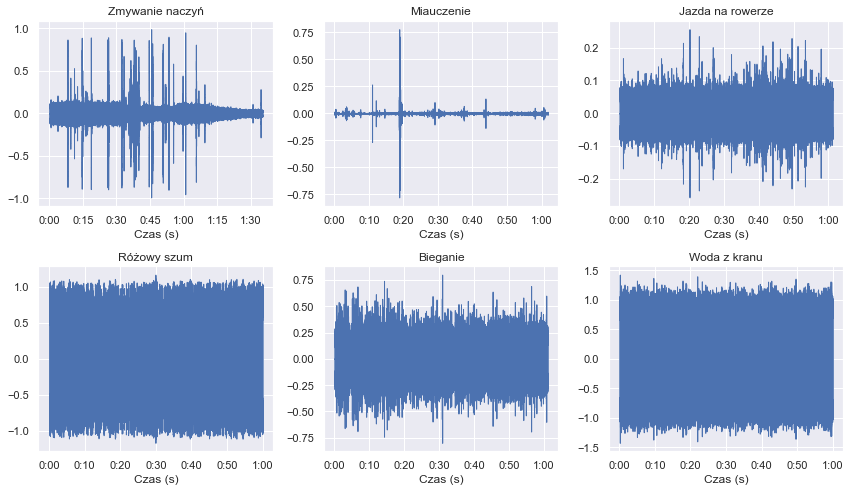

In [188]:
fig, ax = plt.subplots(2, 3)
ax = ax.ravel()

for i in range(len(ax)):
    librosa.display.waveshow(noises[i], sr=sr, ax=ax[i])
    ax[i].set_title(szumy[i])
    ax[i].set_xlabel('Czas (s)')
plt.tight_layout()
plt.show()

In [ ]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\szumy.png')

# Zaszumienie danych

In [191]:
(y / y.std())

0.99999994

In [235]:
def noising(y, s, SNR):
    n = len(y)
    m = len(s)
    signal_avg_power = np.mean(y ** 2)
    signal_avg_power_db = 10 * np.log10(signal_avg_power)
    noise_power_db = signal_avg_power_db - SNR
    noise_power = 10 ** (noise_power_db/10)
    boundary = np.random.randint(0, m-n)
    sampled_noise = s[boundary:boundary+n]
    sampled_noise *= noise_power / sampled_noise.std()
    return y + sampled_noise

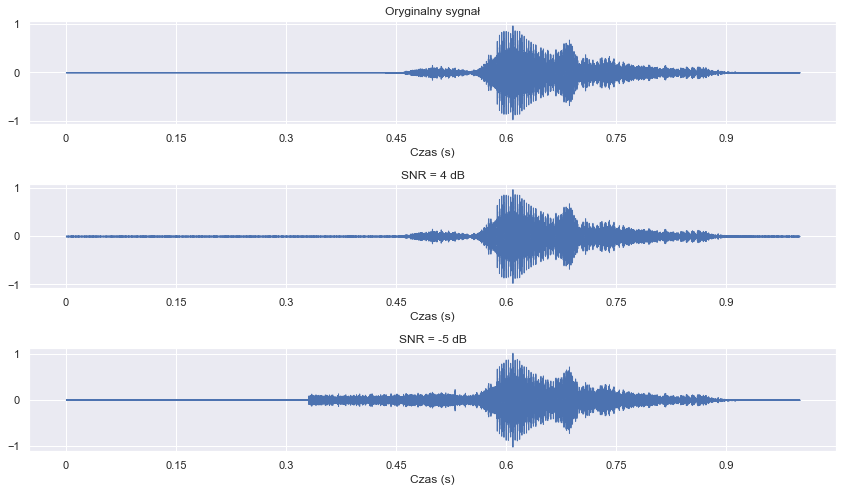

In [251]:
np.random.seed(7)
fig, ax = plt.subplots(3, 1)
ax = ax.ravel()

librosa.display.waveshow(y, sr=sr, ax=ax[0])
ax[0].set_title('Oryginalny sygnał')
ax[0].set_xlabel('Czas (s)')
librosa.display.waveshow(noising(y, noises[5], 4), sr=sr, ax=ax[1])
ax[1].set_title('SNR = 4 dB')
ax[1].set_xlabel('Czas (s)')
librosa.display.waveshow(noising(y, noises[5], -5), sr=sr, ax=ax[2])
ax[2].set_title('SNR = -5 dB')
ax[2].set_xlabel('Czas (s)')


plt.tight_layout()
plt.show()

In [252]:
fig.savefig(r'D:\studia\Semestr 7\Seminarium dyplomowe\prezka\img\zaszumienie.png')

In [231]:
IPython.display.Audio(y, rate=sr)

In [240]:
IPython.display.Audio(noising(y, noises[5], 1), rate=sr)